In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patheffects as path_effects
import os
import gzip
from pathlib import Path
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec


In [2]:
!jupyter nbconvert --to html "C:\Users\Usuario\Documents\Github\Seguridad Economica\src\notebooks\visualization\Nota Elcano\nota_elcano.ipynb"

[NbConvertApp] Converting notebook C:\Users\Usuario\Documents\Github\Seguridad Economica\src\notebooks\visualization\Nota Elcano\nota_elcano.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 8 image(s).
[NbConvertApp] Writing 13797094 bytes to C:\Users\Usuario\Documents\Github\Seguridad Economica\src\notebooks\visualization\Nota Elcano\nota_elcano.html


In [3]:


# Configuración para gráficos de alta calidad
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
sns.set_style("whitegrid")

# Definir rutas
current_dir = Path.cwd()
base_path = current_dir.parent.parent.parent
files_path = base_path / "data" / "processed" / "ficheros_paper"
output_path_fig = current_dir / "figures" 
output_path_tabs = current_dir / "tables" 
# Crear directorios de salida si no existen
os.makedirs(output_path_fig, exist_ok=True)
os.makedirs(output_path_tabs, exist_ok=True)

# Cargar datos de dependencias
df_full = pd.read_csv(files_path / "dependencies_full.csv.gz", sep=";")
df_weighted = pd.read_csv(files_path / "weighted_dependencies.csv.gz", sep=";")
df_critical = pd.read_csv(files_path / "critical_relations.csv.gz", sep=";")
df_intermediary = pd.read_csv(files_path / "intermediary_roles.csv.gz", sep=";")
df_summary = pd.read_csv(files_path / "intermediary_summary.csv.gz", sep=";")

print("📊 Datos cargados correctamente")
print(f"Número de registros en df_full: {len(df_full)}")
print(f"Número de registros en df_intermediary: {len(df_intermediary)}")

# Sectores estratégicos para el análisis
sectores_estrategicos = [
    'Aircraft and spacecraft',
    'Accumulators primary cells and batteries',
    'Basic iron and steel',
    'Basic precious and non-ferrous metals',
    'Electronic valves tubes etc.',
    'TV and radio receivers and associated goods',
    'Office accounting and computing machinery',
    'Medical surgical and orthopaedic equipment',
    'Optical instruments & photographic equipment'
]

# Diccionario de aranceles
aranceles = {
  # Imagen 1
  "COL": 10,  # Colombia
  "SGP": 10,  # Singapur
  "TUR": 10,  # Turquía
  "GBR": 10,  # Reino Unido
  
  # Imagen 2
  "PHL": 18,  # Filipinas
  "ZWE": 18,  # Zimbabue
  "ISR": 17,  # Israel
  "ZMB": 17,  # Zambia
  "MOZ": 16,  # Mozambique
  "NOR": 16,  # Noruega
  "VEN": 15,  # Venezuela
  "NGA": 14,  # Nigeria
  "TCD": 13,  # Chad
  "GNQ": 13,  # Guinea Ecuatorial
  "CMR": 12,  # Camerún
  "COD": 11,  # República Democrática del Congo
  "AUS": 10,  # Australia
  "BRA": 10,  # Brasil
  "CHL": 10,  # Chile
  
  # Imagen 3
  "PAK": 30,  # Pakistán
  "TUN": 28,  # Túnez
  "IND": 27,  # India
  "KAZ": 27,  # Kazajistán
  "KOR": 26,  # Corea del Sur
  "BRN": 24,  # Brunei
  "JPN": 24,  # Japón
  "MYS": 24,  # Malasia
  "VUT": 23,  # Vanuatu
  "CIV": 21,  # Costa de Marfil
  "NAM": 21,  # Namibia
  "JOR": 20,  # Jordania
  "NIC": 19,  # Nicaragua
  "MWI": 18,  # Malawi
  
  # Imagen 4
  "LIE": 37,  # Liechtenstein
  "THA": 37,  # Tailandia
  "BIH": 36,  # Bosnia-Herzegovina
  "CHN": 34,  # China
  "MKD": 33,  # Macedonia del Norte
  "AGO": 32,  # Angola
  "FJI": 32,  # Fiyi
  "IDN": 32,  # Indonesia
  "CHE": 32,  # Suiza
  "TWN": 32,  # Taiwán
  "LBY": 31,  # Libia
  "MDA": 31,  # Moldavia
  "ZAF": 31,  # Sudáfrica
  "DZA": 30,  # Argelia
  "NRU": 30,  # Nauru
  
  # Imagen 5
  "LSO": 50,  # Lesoto
  "KHM": 49,  # Camboya
  "LAO": 48,  # Laos
  "MDG": 47,  # Madagascar
  "VNM": 46,  # Vietnam
  "MMR": 45,  # Myanmar
  "LKA": 44,  # Sri Lanka
  "FLK": 42,  # Islas Malvinas/Falklands
  "SYR": 41,  # Siria
  "MUS": 40,  # Mauricio
  "IRQ": 39,  # Irak
  "BWA": 38,  # Botsuana
  "GUY": 38,  # Guyana
  "SRB": 38,  # Serbia
  "BGD": 37,  # Bangladesh
  
  # Países de la Unión Europea (todos con arancel del 20%)
  "AUT": 20,  # Austria
  "BEL": 20,  # Bélgica
  "BGR": 20,  # Bulgaria
  "HRV": 20,  # Croacia
  "CYP": 20,  # Chipre
  "CZE": 20,  # República Checa
  "DNK": 20,  # Dinamarca
  "EST": 20,  # Estonia
  "FIN": 20,  # Finlandia
  "FRA": 20,  # Francia
  "DEU": 20,  # Alemania
  "GRC": 20,  # Grecia
  "HUN": 20,  # Hungría
  "IRL": 20,  # Irlanda
  "ITA": 20,  # Italia
  "LVA": 20,  # Letonia
  "LTU": 20,  # Lituania
  "LUX": 20,  # Luxemburgo
  "MLT": 20,  # Malta
  "NLD": 20,  # Países Bajos
  "POL": 20,  # Polonia
  "PRT": 20,  # Portugal
  "ROU": 20,  # Rumanía
  "SVK": 20,  # Eslovaquia
  "SVN": 20,  # Eslovenia
  "ESP": 20,  # España
  "SWE": 20   # Suecia
}

# Comprobar disponibilidad de los países con aranceles en los datos
paises_aranceles = set(aranceles.keys())
paises_dataset = set(df_full['supplier_country'].unique())
paises_comunes = paises_aranceles.intersection(paises_dataset)

print(f"Total de países con aranceles: {len(paises_aranceles)}")
print(f"Países encontrados en el dataset: {len(paises_comunes)}")
print(f"Países con aranceles no encontrados en el dataset: {len(paises_aranceles - paises_comunes)}")

📊 Datos cargados correctamente
Número de registros en df_full: 7278726
Número de registros en df_intermediary: 34159
Total de países con aranceles: 90
Países encontrados en el dataset: 90
Países con aranceles no encontrados en el dataset: 0


Ejercicio 1: Vulnerabilidad de EE.UU. por dependencia directa e indirecta
Análisis propuesto
Este ejercicio evaluaría cuán vulnerable es Estados Unidos a los aranceles que ha impuesto, analizando su propia dependencia de los países afectados. Visualizaríamos la relación entre el nivel arancelario y el grado de dependencia, identificando posibles "autolesiones" económicas.

Se filtraron 20 países por tener dependencia menor a 0.005


C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1357418417.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supplier_summary_filtered['region'] = supplier_summary_filtered['supplier_country'].apply(get_region)


Gráfico guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\us_vulnerability_all.png
Países de la UE incluidos en el gráfico: 25
Lista de países de la UE: AUT, BEL, BGR, CYP, CZE, DEU, DNK, ESP, EST, FIN, FRA, GRC, HRV, HUN, IRL, ITA, LTU, LUX, LVA, NLD, POL, PRT, ROU, SVK, SWE
Tabla guardada en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables\all_countries_with_tariffs.csv


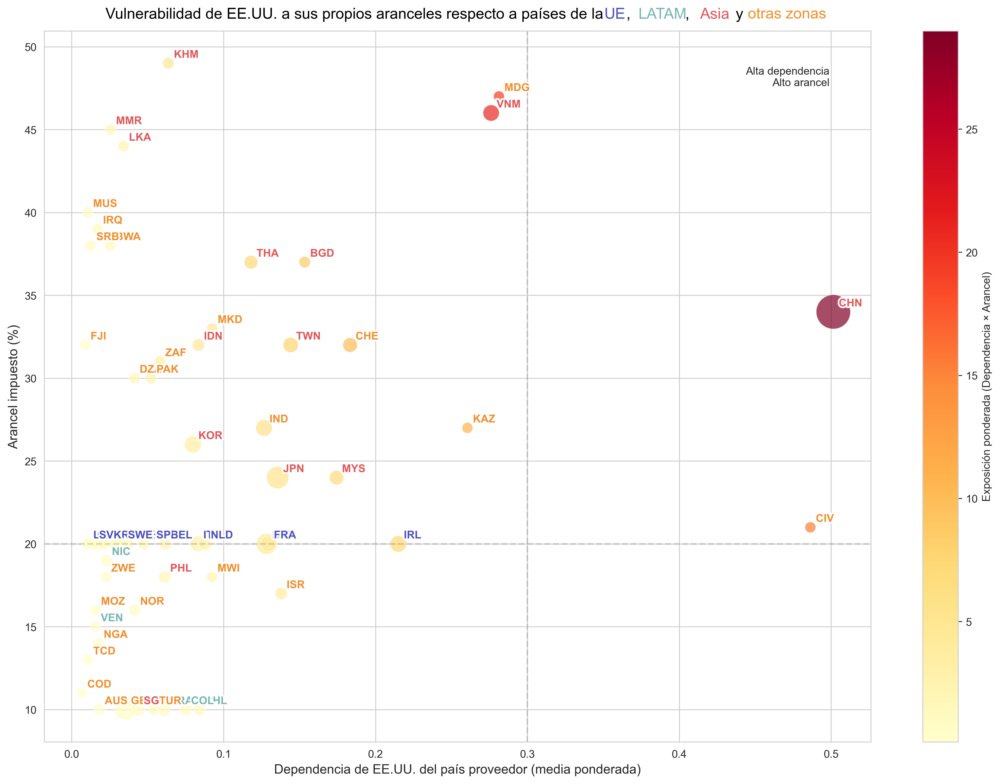

In [4]:
def analizar_vulnerabilidad_eeuu(df_full, aranceles, output_path_fig, output_path_tab, min_dependency=0.005):
    """
    Analiza la vulnerabilidad de EE.UU. a sus propios aranceles.
    
    Args:
        df_full: DataFrame con datos de dependencia
        aranceles: Diccionario de países y sus aranceles
        output_path: Ruta para guardar visualizaciones
        min_dependency: Valor mínimo de dependencia para incluir en el gráfico
    """
    # Filtrar dependencias donde EE.UU. es el importador
    us_dependencies = df_full[df_full['dependent_country'] == 'USA'].copy()
    
    # Añadir columna de aranceles
    us_dependencies['tariff'] = us_dependencies['supplier_country'].map(
        lambda x: aranceles.get(x, 0)
    )
    
    # Calcular exposición ponderada (dependencia * arancel)
    us_dependencies['weighted_exposure'] = us_dependencies['dependency_value'] * us_dependencies['tariff'] / 100
    
    # Agrupar por país proveedor
    supplier_summary = []
    for country, group in us_dependencies.groupby('supplier_country'):
        # Calcular dependencia media ponderada por valor comercial
        weighted_dependency = np.average(
            group['dependency_value'],
            weights=group['trade_value']
        ) if group['trade_value'].sum() > 0 else group['dependency_value'].mean()
        
        # Calcular exposición media ponderada
        weighted_exposure = np.average(
            group['weighted_exposure'],
            weights=group['trade_value']
        ) if group['trade_value'].sum() > 0 else group['weighted_exposure'].mean()
        
        supplier_summary.append({
            'supplier_country': country,
            'dependency_value': weighted_dependency,
            'tariff': group['tariff'].iloc[0],  # Todos los registros del mismo país tienen el mismo arancel
            'weighted_exposure': weighted_exposure * len(group),  # Multiplicamos por el número de industrias
            'trade_value': group['trade_value'].sum(),
            'num_industries': len(group)
        })
    
    # Convertir a DataFrame
    supplier_summary = pd.DataFrame(supplier_summary)
    
    # Filtrar solo países con aranceles mayores que cero
    supplier_summary = supplier_summary[supplier_summary['tariff'] > 0]
    
    # Filtrar países con dependencia mínima para el gráfico
    supplier_summary_filtered = supplier_summary[supplier_summary['dependency_value'] >= min_dependency]
    
    # Contar cuántos países fueron filtrados por baja dependencia
    filtered_countries = len(supplier_summary) - len(supplier_summary_filtered)
    print(f"Se filtraron {filtered_countries} países por tener dependencia menor a {min_dependency}")
    
    # Calcular por sector para los países top
    sector_exposure = []
    # Solo consideramos los 5 países con mayor exposición para el análisis sectorial
    top_countries = supplier_summary.sort_values('weighted_exposure', ascending=False).head(5)['supplier_country'].tolist()
    
    for country in top_countries:
        country_data = us_dependencies[us_dependencies['supplier_country'] == country]
        
        for industry, industry_group in country_data.groupby('industry'):
            if industry_group['trade_value'].sum() > 0:
                weighted_exp = np.average(
                    industry_group['weighted_exposure'],
                    weights=industry_group['trade_value']
                )
                weighted_dep = np.average(
                    industry_group['dependency_value'],
                    weights=industry_group['trade_value']
                )
            else:
                weighted_exp = industry_group['weighted_exposure'].mean()
                weighted_dep = industry_group['dependency_value'].mean()
                
            sector_exposure.append({
                'supplier_country': country,
                'industry': industry,
                'dependency_value': weighted_dep,
                'weighted_exposure': weighted_exp,
                'trade_value': industry_group['trade_value'].sum()
            })
    
    sector_exposure = pd.DataFrame(sector_exposure)
    
    # Visualización
    fig, ax = plt.subplots(figsize=(14, 10))  # Aumentamos el tamaño para acomodar más países
    
    # Normalizar el tamaño para evitar burbujas demasiado pequeñas o grandes
    min_size = 100
    max_size = 1000
    
    if supplier_summary_filtered['trade_value'].max() > 0:
        size_scale = supplier_summary_filtered['trade_value'] / supplier_summary_filtered['trade_value'].max() * (max_size - min_size) + min_size
    else:
        size_scale = [min_size] * len(supplier_summary_filtered)
    
    # Lista para guardar países UE para etiquetado especial
    eu_countries = []
    
    # Asignar regiones a países
    def get_region(country):
        eu_members = [
            "AUT", "BEL", "BGR", "HRV", "CYP", "CZE", "DNK", "EST", "FIN", "FRA",
            "DEU", "GRC", "HUN", "IRL", "ITA", "LVA", "LTU", "LUX", "MLT", "NLD",
            "POL", "PRT", "ROU", "SVK", "SVN", "ESP", "SWE"
        ]
        asia_countries = [
            "CHN", "JPN", "KOR", "TWN", "VNM", "THA", "MYS", "IDN", "PHL", "SGP",
            "BRN", "KHM", "LAO", "MMR", "LKA", "BGD"
        ]
        latam_countries = [
            "MEX", "BRA", "ARG", "COL", "CHL", "PER", "VEN", "ECU", "NIC"
        ]
        
        if country in eu_members:
            return 'EU'
        elif country in asia_countries:
            return 'ASIA'
        elif country in latam_countries:
            return 'LATAM'
        else:
            return 'OTHER'
    
    supplier_summary_filtered['region'] = supplier_summary_filtered['supplier_country'].apply(get_region)
    
    # Crear un conjunto de colores basado en ponderación de exposición
    norm = plt.Normalize(supplier_summary_filtered['weighted_exposure'].min(), supplier_summary_filtered['weighted_exposure'].max())
    cmap = plt.cm.YlOrRd
    
    # Crear el scatter plot con una variable para almacenar el scatter
    scatter_plots = []
    scatter_labels = []
    
    for i, region in enumerate(['EU', 'ASIA', 'LATAM', 'OTHER']):
        region_data = supplier_summary_filtered[supplier_summary_filtered['region'] == region]
        
        if not region_data.empty:
            scatter = ax.scatter(
                region_data['dependency_value'], 
                region_data['tariff'],
                s=region_data['trade_value'] / supplier_summary_filtered['trade_value'].max() * (max_size - min_size) + min_size,
                c=region_data['weighted_exposure'],
                cmap=cmap,
                norm=norm,
                alpha=0.7,
                edgecolors='white',
                linewidth=0.5,
                label=region
            )
            scatter_plots.append(scatter)
            scatter_labels.append(region)
    
    # Anotar países
    # Definir colores específicos para cada región
    region_colors = {
        'EU': '#4C51BF',      # Azul para UE
        'ASIA': '#E15759',    # Rojo para Asia
        'LATAM': '#76B7B2',   # Verde-azul para Latinoamérica
        'OTHER': '#F28E2B'    # Naranja para otros
    }

    # Anotar países con colores según región
    for _, row in supplier_summary_filtered.iterrows():
        # Obtener el color según la región
        region = row['region']
        color = region_colors.get(region, 'black')
        
        # Almacenar países UE para análisis posterior
        if region == 'EU':
            eu_countries.append(row['supplier_country'])
        
        # Tamaño de fuente según la región
        fontsize = 10 if region == 'EU' else 10
        
        # Crear anotación con el color correspondiente
        text = ax.annotate(
            row['supplier_country'],
            (row['dependency_value'], row['tariff']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=fontsize,
            color=color,
            fontweight='bold',
            path_effects=[path_effects.withStroke(linewidth=3, foreground='white')]
        )
    
    # Etiquetas y título
    ax.set_xlabel('Dependencia de EE.UU. del país proveedor (media ponderada)', fontsize=12)
    ax.set_ylabel('Arancel impuesto (%)', fontsize=12)
    # Título con colores diferenciados por región
    from matplotlib.text import Text

    # Eliminar el título anterior
    ax.set_title('')

    # Crear texto para el título base
    title = fig.suptitle("", fontsize=16)

    # Añadir cada parte del título con su propio color
    text_parts = [
        ("Vulnerabilidad de EE.UU. a sus propios aranceles respecto a países de la ", 'black'),
        ("UE", region_colors['EU']),
        ("  ,", 'black'),
        ("LATAM", region_colors['LATAM']),
        ("   ,", 'black'),
        ("Asia", region_colors['ASIA']),
        ("  y", 'black'),
        ("otras zonas", region_colors['OTHER'])
    ]

    # Crear un conjunto de textos con colores
    title_texts = []
    current_x = 0.1  # Posición inicial - ajustar según necesidades
    for text, color in text_parts:
        t = fig.text(current_x, 1, text, color=color, fontsize=14, 
                    va='top', ha='left')
        title_texts.append(t)
        # Avanzar la posición X basada en el ancho del texto
        current_x += len(text) * 0.00625  # Factor de ajuste según tamaño de figura
    
    # Líneas de referencia
    ax.axhline(y=20, color='gray', linestyle='--', alpha=0.3)
    ax.axvline(x=0.3, color='gray', linestyle='--', alpha=0.3)
    
    # Colorbar - corregido para usar el eje actual
    if scatter_plots:  # Solo si hay al menos un scatter plot
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax)  # Especificamos el eje
        cbar.set_label('Exposición ponderada (Dependencia × Arancel)', fontsize=10)
    
   
        
        
    # Marcar cuadrantes
    
    plt.text(0.95, 0.95, "Alta dependencia\nAlto arancel", transform=ax.transAxes, 
             fontsize=10, verticalalignment='top', horizontalalignment='right')
    
    
    plt.tight_layout()
    
    # Guardar figura
    plt.savefig(output_path_fig / "us_vulnerability_all.png", dpi=300, bbox_inches='tight')
    
    print(f"Gráfico guardado en: {output_path_fig / 'us_vulnerability_all.png'}")
    
    # Verificar cuántos países de la UE están incluidos
    print(f"Países de la UE incluidos en el gráfico: {len(eu_countries)}")
    print(f"Lista de países de la UE: {', '.join(eu_countries)}")
    
    # También crear una tabla con todos los países
    countries_table = supplier_summary.sort_values('weighted_exposure', ascending=False)[['supplier_country', 'dependency_value', 'tariff', 'weighted_exposure', 'trade_value']]
    countries_table.columns = ['País', 'Dependencia promedio', 'Arancel (%)', 'Exposición ponderada', 'Volumen comercial']
    
    # Guardar tabla como CSV
    countries_table.to_csv(output_path_tab / "all_countries_with_tariffs.csv", index=False)
    
    # También guardar como tabla LaTeX
    latex_table = countries_table.to_latex(index=False, float_format="%.4f")
    with open(output_path_tab / "all_countries_with_tariffs.tex", "w") as f:
        f.write(latex_table)
    
    print(f"Tabla guardada en: {output_path_tab / 'all_countries_with_tariffs.csv'}")
    
    return {
        'supplier_summary': supplier_summary, 
        'filtered_summary': supplier_summary_filtered,
        'sector_exposure': sector_exposure,
        'top_countries': top_countries,
        'eu_countries': eu_countries
    }

resultados = analizar_vulnerabilidad_eeuu(df_full, aranceles, output_path_fig, output_path_tabs, min_dependency=0.005)

 Ejercicio 2: Impacto sectorial estratificado por nivel arancelario

Análisis propuesto

Evaluaríamos el impacto de los aranceles en sectores estratégicos, agrupando países según el nivel arancelario (10-20%, 21-30%, 31-40%, >40%).

In [5]:
# Filtrar por sectores estratégicos y solo registros donde EE.UU. es importador
sector_data = df_full[
    (df_full['industry'].isin(sectores_estrategicos)) &
    (df_full['dependent_country'] == 'USA')
].copy()

In [6]:
# Añadir columna de aranceles y grupo arancelario
sector_data['tariff'] = sector_data['supplier_country'].map(lambda x: aranceles.get(x, 0))
sector_data['tariff_group'] = pd.cut(
    sector_data['tariff'], 
    bins=[0, 10, 20, 30, 40, 100],
    labels=['0-10%', '11-20%', '21-30%', '31-40%', '>40%']
)

In [7]:
# Filtrar solo registros con aranceles > 0
sector_data = sector_data[sector_data['tariff'] > 0]


In [8]:
# Filtrar por sectores estratégicos y solo registros donde EE.UU. es importador
sector_data = df_full[
    (df_full['industry'].isin(sectores_estrategicos)) &
    (df_full['dependent_country'] == 'USA')
].copy()

# Añadir columna de aranceles y grupo arancelario
sector_data['tariff'] = sector_data['supplier_country'].map(lambda x: aranceles.get(x, 0))
sector_data['tariff_group'] = pd.cut(
    sector_data['tariff'], 
    bins=[0, 10, 20, 30, 40, 100],
    labels=['0-10%', '11-20%', '21-30%', '31-40%', '>40%']
)

# Filtrar solo registros con aranceles > 0
sector_data = sector_data[sector_data['tariff'] > 0]

# Agrupar por país y sector para calcular suma de dependencias
country_sector_data = []
for (tariff, industry), group in sector_data.groupby(['tariff_group', 'industry']):
    # Calcular dependencia media ponderada por valor comercial
    sum_dependency = group['dependency_value'].sum()
    
    country_sector_data.append({
        'tariff_group': tariff,
        'industry': industry,
        'tariff': aranceles.get(tariff, 0),
        'tariff_group': pd.cut([aranceles.get(tariff, 0)], 
                                bins=[0, 10, 20, 30, 40, 100],
                                labels=['0-10%', '11-20%', '21-30%', '31-40%', '>40%'])[0],
        'dependency_value': sum_dependency,
        'trade_value': group['trade_value'].sum()
    })

country_sector_df = pd.DataFrame(country_sector_data)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\280228205.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (tariff, industry), group in sector_data.groupby(['tariff_group', 'industry']):


C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\2071476288.py:139: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(sector_slice['tariff_group'], rotation=45, ha='right')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\2071476288.py:139: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(sector_slice['tariff_group'], rotation=45, ha='right')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\2071476288.py:139: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(sector_slice['tariff_group'], rotation=45, ha='right')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\2071476288.py:139: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() o

Gráfico guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\sectoral_impact.png
Tablas guardadas en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables


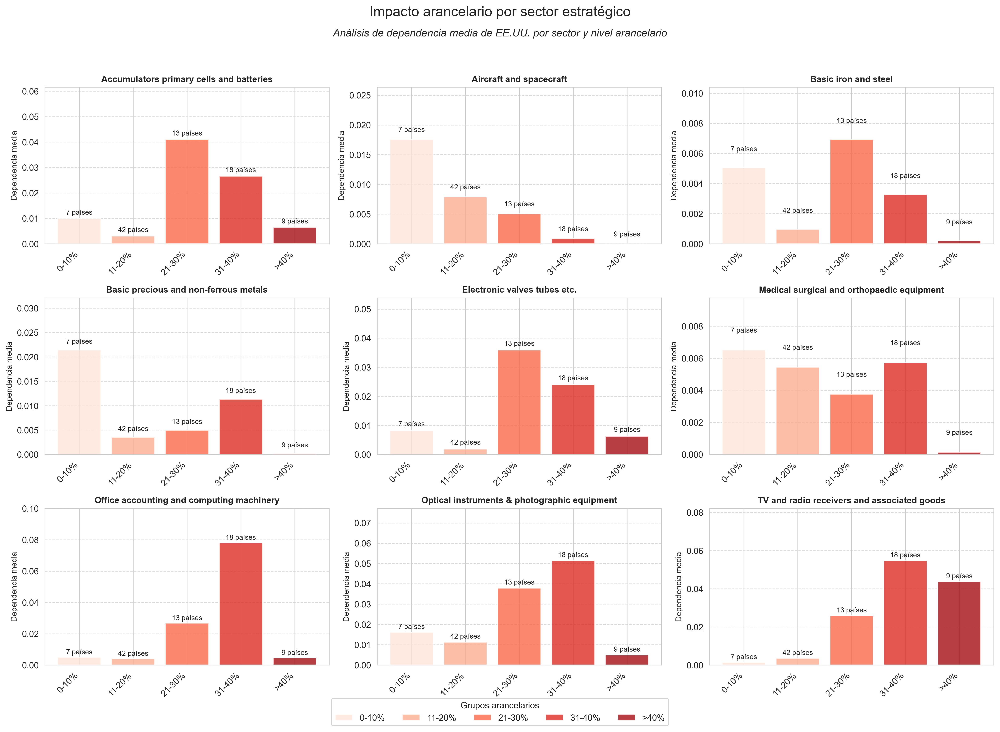

In [9]:
def analizar_impacto_sectorial(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tab):
    """
    Analiza el impacto sectorial de los aranceles.
    
    Args:
        df_full: DataFrame con datos de dependencia
        aranceles: Diccionario de países y sus aranceles
        sectores_estrategicos: Lista de sectores a analizar
        output_path_fig: Ruta para guardar visualizaciones
        output_path_tab: Ruta para guardar tablas
    """
    # Filtrar por sectores estratégicos y solo registros donde EE.UU. es importador
    sector_data = df_full[
        (df_full['industry'].isin(sectores_estrategicos)) &
        (df_full['dependent_country'] == 'USA')
    ].copy()
    
    # Añadir columna de aranceles y grupo arancelario
    sector_data['tariff'] = sector_data['supplier_country'].map(lambda x: aranceles.get(x, 0))
    sector_data['tariff_group'] = pd.cut(
        sector_data['tariff'], 
        bins=[0, 10, 20, 30, 40, 100],
        labels=['0-10%', '11-20%', '21-30%', '31-40%', '>40%']
    )
    
    # Filtrar solo registros con aranceles > 0
    sector_data = sector_data[sector_data['tariff'] > 0]
    
    # Agrupar por país y sector para calcular suma de dependencias
    country_sector_data = []
    for (country, industry), group in sector_data.groupby(['supplier_country', 'industry']):
        # Calcular dependencia media ponderada por valor comercial
        sum_dependency = np.average(
            group['dependency_value'],
            weights=group['trade_value']
        ) if group['trade_value'].sum() > 0 else group['dependency_value'].mean()
        
        country_sector_data.append({
            'supplier_country': country,
            'industry': industry,
            'tariff': aranceles.get(country, 0),
            'tariff_group': pd.cut([aranceles.get(country, 0)], 
                                 bins=[0, 10, 20, 30, 40, 100],
                                 labels=['0-10%', '11-20%', '21-30%', '31-40%', '>40%'])[0],
            'dependency_value': sum_dependency,
            'trade_value': group['trade_value'].sum()
        })
    
    country_sector_df = pd.DataFrame(country_sector_data)
    
    # Agrupar por sector e intervalo arancelario
    impact_summary = country_sector_df.groupby(['industry', 'tariff_group']).agg({
        'dependency_value': 'mean',
        'trade_value': 'sum',
        'supplier_country': 'count'
    }).reset_index()
    
    # Asignar regiones a países para análisis adicional
    def get_region(country):
        eu_members = [
            "AUT", "BEL", "BGR", "HRV", "CYP", "CZE", "DNK", "EST", "FIN", "FRA",
            "DEU", "GRC", "HUN", "IRL", "ITA", "LVA", "LTU", "LUX", "MLT", "NLD",
            "POL", "PRT", "ROU", "SVK", "SVN", "ESP", "SWE"
        ]
        asia_countries = [
            "CHN", "JPN", "KOR", "TWN", "VNM", "THA", "MYS", "IDN", "PHL", "SGP",
            "BRN", "KHM", "LAO", "MMR", "LKA", "BGD"
        ]
        latam_countries = [
            "MEX", "BRA", "ARG", "COL", "CHL", "PER", "VEN", "ECU", "NIC"
        ]
        
        if country in eu_members:
            return 'EU'
        elif country in asia_countries:
            return 'ASIA'
        elif country in latam_countries:
            return 'LATAM'
        else:
            return 'OTHER'
    
    country_sector_df['region'] = country_sector_df['supplier_country'].apply(get_region)
    
    # Colores para grupos arancelarios
    tariff_colors = {
        '0-10%': '#fee5d9',
        '11-20%': '#fcae91',
        '21-30%': '#fb6a4a',
        '31-40%': '#de2d26',
        '>40%': '#a50f15'
    }
    
    # Crear visualización
    fig = plt.figure(figsize=(16, 12))
    
    # Un subplot por sector
    sectors = sorted(impact_summary['industry'].unique())
    n_sectors = len(sectors)
    
    # Determinar filas y columnas para subplots
    cols = min(3, n_sectors)
    rows = (n_sectors + cols - 1) // cols
    
    for i, sector in enumerate(sectors):
        sector_slice = impact_summary[impact_summary['industry'] == sector].sort_values('tariff_group')
        
        ax = plt.subplot(rows, cols, i+1)
        
        # Colores para las barras
        bar_colors = [tariff_colors.get(group, '#999999') for group in sector_slice['tariff_group']]
        
        bars = ax.bar(
            sector_slice['tariff_group'],
            sector_slice['dependency_value'],
            color=bar_colors,
            alpha=0.8
        )
        
        # Añadir número de países sobre cada barra
        for bar, count in zip(bars, sector_slice['supplier_country']):
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width()/2.,
                height + 0.01 * max(0.1, ax.get_ylim()[1]), # Asegurar que esté visible
                f'{count} países',
                ha='center', va='bottom',
                fontsize=8
            )
        
        # Añadir grid horizontal
        ax.yaxis.grid(True, linestyle='--', alpha=0.7)
        
        # Título y formato del eje
        ax.set_title(sector, fontsize=10, fontweight='bold')
        ax.set_ylim(0, min(0.1, sector_slice['dependency_value'].max() * 1.5))  # Espacio para etiquetas
        ax.set_ylabel('Dependencia media', fontsize=9)
        
        # Formato de etiquetas
        ax.set_xticklabels(sector_slice['tariff_group'], rotation=45, ha='right')
        
        # Análisis regional - ahora lo guardaremos para análisis posterior en lugar de mostrarlo en el gráfico
        region_counts = {}
        for group in sector_slice['tariff_group']:
            countries = country_sector_df[
                (country_sector_df['industry'] == sector) & 
                (country_sector_df['tariff_group'] == group)
            ]['supplier_country'].tolist()
            
            if countries:
                regions = country_sector_df[
                    (country_sector_df['industry'] == sector) & 
                    (country_sector_df['tariff_group'] == group)
                ]['region'].value_counts().to_dict()
                region_counts[group] = regions
    
    # Título general
    plt.suptitle('Impacto arancelario por sector estratégico', fontsize=16, y=0.98)
    
    # Subtítulo explicativo
    plt.figtext(0.5, 0.94, 
                'Análisis de dependencia media de EE.UU. por sector y nivel arancelario', 
                ha='center', fontsize=12, style='italic')
    
    # Leyenda para grupos arancelarios
    legend_patches = [plt.Rectangle((0, 0), 1, 1, fc=color, alpha=0.8) 
                      for group, color in tariff_colors.items()]
    fig.legend(legend_patches, tariff_colors.keys(), 
               loc='lower center', ncol=5, frameon=True, 
               bbox_to_anchor=(0.5, 0.02), title='Grupos arancelarios')
    
    plt.tight_layout(rect=[0, 0.05, 1, 0.93])  # Ajustar para dejar espacio a título y leyenda
    
    # Guardar figura
    plt.savefig(output_path_fig / "sectoral_impact.png", dpi=300, bbox_inches='tight')
    print(f"Gráfico guardado en: {output_path_fig / 'sectoral_impact.png'}")
    
    # Crear tabla con distribución regional por sector y grupo arancelario
    regional_distribution = []
    for sector in sectors:
        for group in ['0-10%', '11-20%', '21-30%', '31-40%', '>40%']:
            countries = country_sector_df[
                (country_sector_df['industry'] == sector) & 
                (country_sector_df['tariff_group'] == group)
            ]
            
            if not countries.empty:
                region_counts = countries['region'].value_counts().to_dict()
                regional_distribution.append({
                    'industry': sector,
                    'tariff_group': group,
                    'EU': region_counts.get('EU', 0),
                    'ASIA': region_counts.get('ASIA', 0),
                    'LATAM': region_counts.get('LATAM', 0),
                    'OTHER': region_counts.get('OTHER', 0),
                    'total_countries': len(countries),
                    'avg_dependency': countries['dependency_value'].mean()
                })
    
    region_df = pd.DataFrame(regional_distribution)
    region_df.to_csv(output_path_tab / "regional_distribution.csv", index=False)
    
    # Crear y guardar tabla detallada
    table_data = country_sector_df.sort_values(['industry', 'tariff', 'dependency_value'], ascending=[True, False, False])
    table_data.to_csv(output_path_tab / "sectoral_impact_detailed.csv", index=False)
    
    # Tabla resumen
    summary_table = impact_summary.pivot_table(
        index='industry', 
        columns='tariff_group', 
        values='dependency_value', 
        aggfunc='mean'
    ).fillna(0)
    
    summary_table.to_csv(output_path_tab / "sectoral_impact_summary.csv")
    
    try:
        latex_table = summary_table.to_latex(float_format="%.3f")
        with open(output_path_tab / "sectoral_impact_summary.tex", "w") as f:
            f.write(latex_table)
    except Exception as e:
        print(f"Error al generar la tabla LaTeX: {e}")
    
    print(f"Tablas guardadas en: {output_path_tab}")
    
    return {
        'impact_summary': impact_summary,
        'country_sector_data': country_sector_df,
        'regional_distribution': region_df
    }
resultados_impacto_sectorial = analizar_impacto_sectorial(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tabs)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # Importar Seaborn
from pathlib import Path

def analizar_impacto_sectorial_boxplot(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tab):
    """
    Analiza el impacto sectorial de los aranceles usando box plots para mostrar
    la distribución de la dependencia original.
    
    Args:
        df_full: DataFrame con datos de dependencia originales.
        aranceles: Diccionario de países y sus aranceles.
        sectores_estrategicos: Lista de sectores a analizar.
        output_path_fig: Ruta para guardar visualizaciones (Path object).
        output_path_tab: Ruta para guardar tablas (Path object).
    """
    # --- PASOS INICIALES (Sin cambios) ---
    sector_data = df_full[
        (df_full['industry'].isin(sectores_estrategicos)) &
        (df_full['dependent_country'] == 'USA')
    ].copy()
    
    sector_data['tariff'] = sector_data['supplier_country'].map(lambda x: aranceles.get(x, 0))
    
    # Definir los grupos y etiquetas arancelarios
    tariff_bins = [-0.1, 10, 20, 30, 40, 100] # Incluir un límite inferior para capturar >0
    tariff_labels = ['0-10%', '11-20%', '21-30%', '31-40%', '>40%']
    
    sector_data['tariff_group'] = pd.cut(
        sector_data['tariff'], 
        bins=tariff_bins,
        labels=tariff_labels,
        right=True
    )

    # Filtrar solo registros con aranceles > 0
    sector_data_filtered = sector_data[sector_data['tariff'] > 0].copy()
    sector_data_filtered = sector_data_filtered[sector_data_filtered['dependency_value'] > 0].copy()
    
    # Asegurar que 'tariff_group' sea categórica con el orden correcto
    sector_data_filtered['tariff_group'] = pd.Categorical(
        sector_data_filtered['tariff_group'],
        categories=tariff_labels,
        ordered=True
    )
    
    # --- DATOS LISTOS PARA BOXPLOT ---
    # No necesitamos la agregación 'impact_summary' para este gráfico

    # --- VISUALIZACIÓN CON BOXPLOTS (Seaborn) ---
    tariff_colors = {
        '0-10%': '#fee5d9', '11-20%': '#fcae91', '21-30%': '#fb6a4a',
        '31-40%': '#de2d26', '>40%': '#a50f15'
    }
    
    # Orden de los grupos para el eje X
    tariff_order = tariff_labels
    
    fig = plt.figure(figsize=(16, 12))
    sectors = sorted(sector_data_filtered['industry'].unique())
    n_sectors = len(sectors)
    cols = min(3, n_sectors)
    rows = (n_sectors + cols - 1) // cols
    
    for i, sector in enumerate(sectors):
        ax = plt.subplot(rows, cols, i+1)
        
        # Filtrar datos solo para este sector
        sector_slice_data = sector_data_filtered[sector_data_filtered['industry'] == sector]
        
        # Crear el boxplot con Seaborn
        sns.boxplot(
            data=sector_slice_data,
            x='tariff_group',
            y='dependency_value',
            order=tariff_order,  # Asegurar orden correcto en eje X
            palette=tariff_colors, # Usar la paleta de colores definida
            showfliers=True,    # Mostrar outliers (puedes poner False si no quieres)
            showmeans=True,      # Añadir un marcador para la media
            meanprops={"marker":"o", # Propiedades del marcador de la media
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"5"},
            ax=ax
        )
            
        ax.yaxis.grid(True, linestyle='--', alpha=0.7)
        ax.set_title(sector, fontsize=10, fontweight='bold')
        
        # *** AJUSTAR ETIQUETA EJE Y ***
        ax.set_ylabel('Distribución Dependencia', fontsize=9) 
        ax.set_xlabel(None) # Quitar etiqueta X individual, se entiende por contexto/título

        # Ajustar etiquetas del eje X
        ax.tick_params(axis='x', labelsize=8) 
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

        # Dejar que Matplotlib/Seaborn ajusten los límites del eje Y automáticamente
        # o ajustar manualmente si es necesario después de ver el resultado inicial
        # max_val = sector_slice_data['dependency_value'].max() # Considerar outliers si se muestran
        # ax.set_ylim(bottom=0, top=max_val * 1.1) # Ejemplo si se necesita ajuste manual

    # Títulos y Leyenda
    plt.suptitle('Distribución de Dependencia por Sector Estratégico y Grupo Arancelario', fontsize=16, y=0.98)
    plt.figtext(0.5, 0.94, 
                'Box plots de la dependencia original de EE.UU.', 
                ha='center', fontsize=12, style='italic')
    
    # La leyenda de colores puede ser menos necesaria aquí, pero la mantenemos por si acaso
    legend_patches = [plt.Rectangle((0, 0), 1, 1, fc=color, alpha=0.8) 
                      for group, color in tariff_colors.items()]
    fig.legend(legend_patches, tariff_colors.keys(), 
               loc='lower center', ncol=5, frameon=True, 
               bbox_to_anchor=(0.5, 0.02), title='Grupos arancelarios')
    
    plt.tight_layout(rect=[0, 0.05, 1, 0.93])
    
    # Guardar figura
    fig_path = output_path_fig / "sectoral_impact_boxplot.png"
    plt.savefig(fig_path, dpi=300, bbox_inches='tight')
    print(f"Gráfico boxplot guardado en: {fig_path}")
    plt.close(fig) # Cerrar figura

    # --- GENERACIÓN DE TABLAS ---
    # La generación de tablas puede seguir como antes (usando agregaciones .mean() o .sum())
    # o adaptarse según necesites. Es independiente de este gráfico boxplot.
    # Aquí dejo la generación de la tabla resumen con MEDIA como ejemplo,
    # puedes cambiarla a SUMA o añadir otras tablas si lo necesitas.
    
    print("Generando tablas resumen (usando MEDIA de dependencia por país)...")
    try:
        # Para la tabla resumen, necesitamos agregar primero por país/industria (media pond.)
        country_sector_avg = sector_data_filtered.groupby(['supplier_country', 'industry', 'tariff_group'], observed=False).apply(
            lambda g: np.average(g['dependency_value'], weights=g['trade_value']) if g['trade_value'].sum() > 0 else g['dependency_value'].mean(),
            include_groups=False # Evitar error en pandas >= 2.1
        ).reset_index(name='avg_dependency_per_country')

        # Luego agregamos por industria/grupo arancelario (media de las medias por país)
        summary_avg = country_sector_avg.groupby(['industry', 'tariff_group'], observed=False).agg(
             avg_dependency=('avg_dependency_per_country', 'mean'),
             num_countries=('supplier_country', 'nunique')
        ).reset_index()

        summary_pivot_avg = summary_avg.pivot_table(
            index='industry', 
            columns='tariff_group', 
            values='avg_dependency'
        ).fillna(0)
        
        summary_pivot_avg.to_csv(output_path_tab / "sectoral_impact_summary_AVG_for_boxplot_context.csv")
        latex_table = summary_pivot_avg.to_latex(float_format="%.3f")
        with open(output_path_tab / "sectoral_impact_summary_AVG_for_boxplot_context.tex", "w") as f:
            f.write(latex_table)
        print(f"Tabla resumen de medias guardada en: {output_path_tab}")
    except Exception as e:
        print(f"Error al generar tabla resumen de medias: {e}")

    # Puedes añadir aquí la generación de otras tablas si las necesitas
    
    # Devolver los DataFrames relevantes
    return {
        'sector_data_filtered': sector_data_filtered # Datos usados para los boxplots
        # Puedes añadir aquí los dataframes de las tablas si los generas
    }


resultados_impacto_sectorial_suma = analizar_impacto_sectorial_boxplot(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tabs)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1671830925.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1671830925.py:98: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1671830925.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1671830925.py:98: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


Gráfico boxplot guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\sectoral_impact_boxplot.png
Generando tablas resumen (usando MEDIA de dependencia por país)...
Tabla resumen de medias guardada en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables


C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\1671830925.py:146: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  summary_pivot_avg = summary_avg.pivot_table(


Ejercicio 3: Vulnerabilidad por intermediarios críticos
Para evaluar cómo los aranceles podrían afectar a los intermediarios críticos y sus efectos secundarios en las cadenas de suministro globales, voy a crear un análisis completo con visualizaciones apropiadas. Este análisis será especialmente valioso para entender las vulnerabilidades sistémicas que no son evidentes en las relaciones comerciales directas.
Interpretación de los resultados
Este análisis proporciona varias visualizaciones y tablas que te permitirán explorar:

Vulnerabilidad de intermediarios críticos a aranceles: Identifica qué intermediarios clave están más expuestos a los aranceles impuestos, considerando tanto su centralidad en la red comercial como el nivel arancelario que enfrentan.
Sectores más afectados por intermediarios con aranceles: Revela qué sectores económicos son más vulnerables a disrupciones debido a los aranceles impuestos a países que actúan como intermediarios críticos.
Red de propagación de efectos arancelarios: Visualiza cómo los aranceles a intermediarios clave pueden propagarse a través de la red comercial, afectando a países y sectores aparentemente desconectados.

Explicación de las visualizaciones
1. Gráfico de vulnerabilidad de intermediarios
Este gráfico de barras horizontales muestra los intermediarios críticos ordenados por su exposición a aranceles. La longitud total de cada barra representa el poder de intermediación del país, mientras que la porción coloreada representa la exposición a aranceles (calculada como el producto de su centralidad por el arancel). Los colores diferencian las regiones (UE, Asia, LATAM, Otros) para facilitar la identificación de patrones regionales.
2. Gráfico de sectores vulnerables
Un gráfico de barras verticales que destaca los sectores económicos más expuestos a disrupciones debido a aranceles impuestos a intermediarios críticos. La altura de cada barra representa la exposición total del sector, calculada agregando la exposición de todos los intermediarios relevantes para ese sector.
3. Red de propagación de efectos arancelarios
Una visualización de red donde:

Los nodos rojos representan intermediarios clave con altos aranceles
Los nodos azules son países exportadores
Los nodos verdes son países importadores
El tamaño de cada nodo refleja su nivel arancelario
El grosor de las conexiones (aristas) representa la intensidad de la dependencia comercial

Esta red permite visualizar las cadenas de propagación potencial de efectos arancelarios a través del sistema comercial global.
Tablas generadas

Intermediarios críticos y su exposición: Una tabla detallada que clasifica los intermediarios por su nivel de exposición a aranceles, incluyendo su centralidad, nivel arancelario y región.
Sectores más vulnerables: Clasificación de sectores económicos según su exposición total a aranceles a través de intermediarios críticos.
Detalles de sectores por intermediario: Una tabla más detallada que muestra la relación específica entre intermediarios clave y los sectores que dominan, junto con su exposición individual.

Conclusiones esperadas
Este análisis debería revelar:

Puntos de presión ocultos en la red comercial global donde aranceles a ciertos intermediarios podrían tener efectos desproporcionados.
Vulnerabilidades sectoriales que podrían no ser evidentes en análisis tradicionales que solo consideran relaciones comerciales directas.
Efectos cascada potenciales a través de la red comercial, mostrando cómo aranceles dirigidos a ciertos países podrían afectar indirectamente a terceros.
Consideraciones estratégicas para políticas comerciales y de diversificación, identificando dónde podrían ser más necesarias las intervenciones para mitigar riesgos.

Este análisis complementa perfectamente los ejercicios anteriores, proporcionando una perspectiva más profunda sobre las vulnerabilidades sistémicas del comercio internacional frente a medidas arancelarias.

Analizando vulnerabilidad por intermediarios críticos...
Gráfico de vulnerabilidad guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\vulnerabilidad_intermediarios.png
Gráfico de sectores vulnerables guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\sectores_vulnerables_intermediarios.png
Red de propagación guardada en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\red_propagacion_aranceles.png
Tablas guardadas en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables


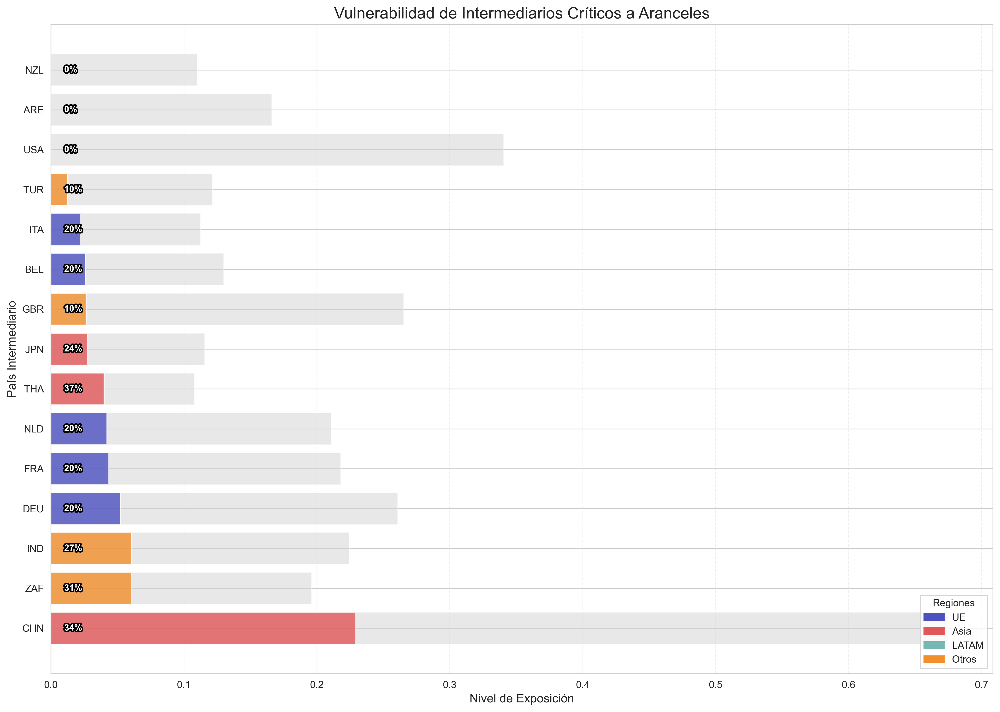

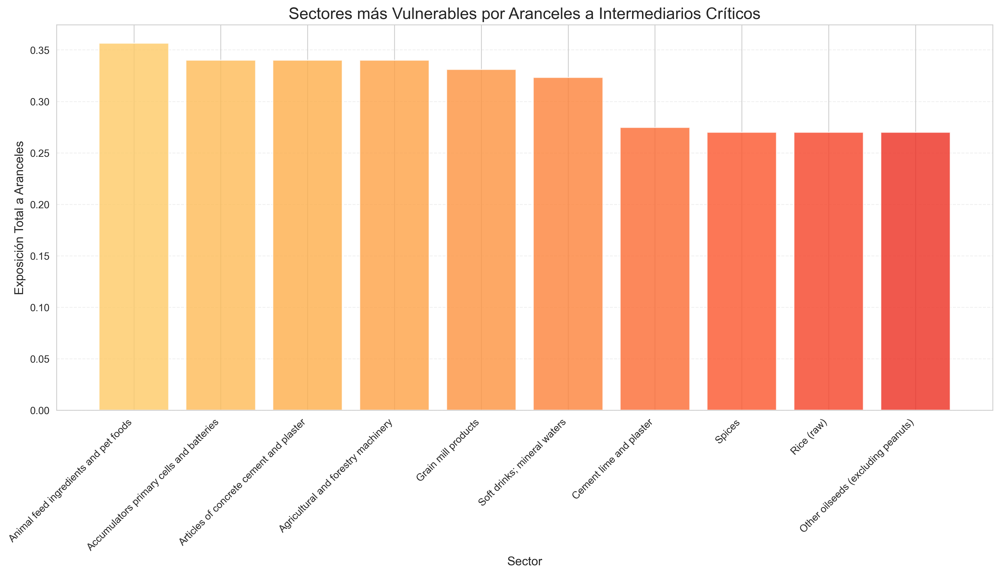

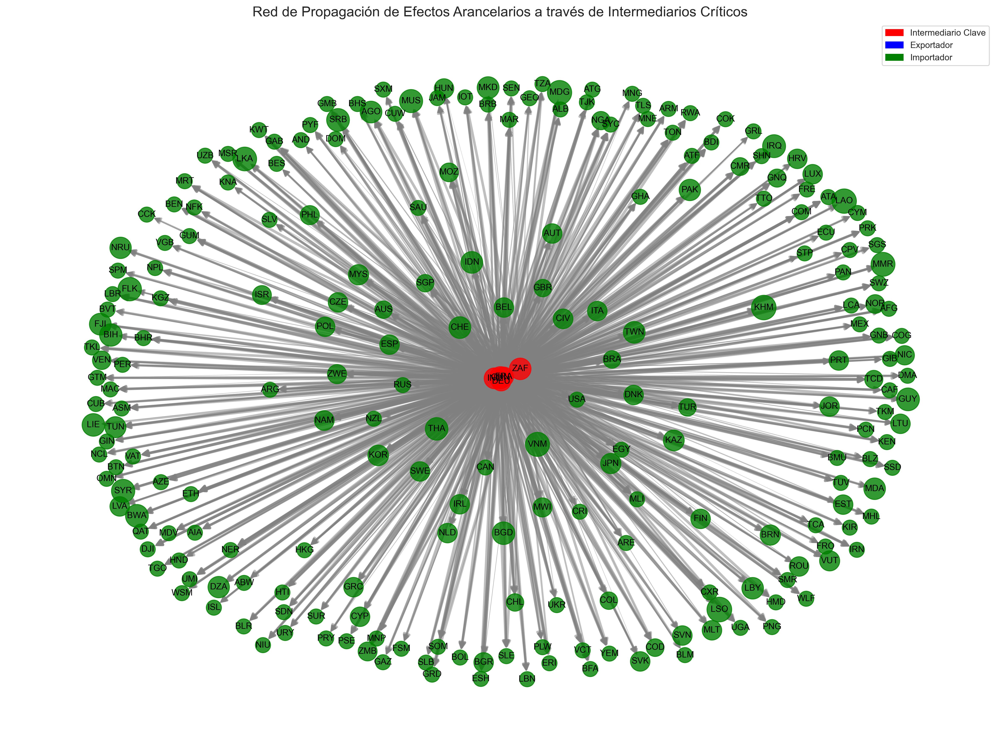

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from pathlib import Path
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patheffects as path_effects

def analizar_vulnerabilidad_intermediarios(df_full, df_intermediary, aranceles, output_path_fig, output_path_tab):
    """
    Analiza la vulnerabilidad de las cadenas de suministro debido a aranceles 
    impuestos a intermediarios críticos.
    
    Args:
        df_full: DataFrame con datos de dependencia
        df_intermediary: DataFrame con datos de intermediarios
        aranceles: Diccionario de países y sus aranceles
        output_path_fig: Ruta para guardar visualizaciones
        output_path_tab: Ruta para guardar tablas
    """
    print("Analizando vulnerabilidad por intermediarios críticos...")
    
    # 1. Identificar intermediarios críticos (top 15 por centralidad)
    top_intermediaries = df_intermediary.groupby('country')['centrality_score'].mean().nlargest(15).reset_index()
    
    # Añadir información de aranceles
    top_intermediaries['tariff'] = top_intermediaries['country'].map(lambda x: aranceles.get(x, 0))
    
    # 2. Calcular exposición a aranceles por intermediario
    # Multiplicar centralidad por arancel para obtener un indicador de "riesgo"
    top_intermediaries['tariff_exposure'] = top_intermediaries['centrality_score'] * top_intermediaries['tariff'] / 100
    
    # 3. Clasificar intermediarios por regiones
    def get_region(country):
        eu_members = [
            "AUT", "BEL", "BGR", "HRV", "CYP", "CZE", "DNK", "EST", "FIN", "FRA",
            "DEU", "GRC", "HUN", "IRL", "ITA", "LVA", "LTU", "LUX", "MLT", "NLD",
            "POL", "PRT", "ROU", "SVK", "SVN", "ESP", "SWE"
        ]
        asia_countries = [
            "CHN", "JPN", "KOR", "TWN", "VNM", "THA", "MYS", "IDN", "PHL", "SGP",
            "BRN", "KHM", "LAO", "MMR", "LKA", "BGD"
        ]
        latam_countries = [
            "MEX", "BRA", "ARG", "COL", "CHL", "PER", "VEN", "ECU", "NIC"
        ]
        
        if country in eu_members:
            return 'UE'
        elif country in asia_countries:
            return 'Asia'
        elif country in latam_countries:
            return 'LATAM'
        else:
            return 'Otros'
    
    top_intermediaries['region'] = top_intermediaries['country'].apply(get_region)
    
    # 4. Crear visualización de intermediarios, su poder y exposición a aranceles
    region_colors = {
        'UE': '#4C51BF', 
        'Asia': '#E15759', 
        'LATAM': '#76B7B2', 
        'Otros': '#F28E2B'
    }
    
    fig, ax = plt.subplots(figsize=(14, 10))
    
    # Ordenar por tariff_exposure
    plot_data = top_intermediaries.sort_values('tariff_exposure', ascending=False)
    
    # Crear barras para centralidad total
    bars = ax.barh(
        plot_data['country'],
        plot_data['centrality_score'],
        color='lightgray',
        alpha=0.5,
        label='Poder de intermediación'
    )
    
    # Superponer barras para exposición a aranceles
    exposure_bars = ax.barh(
        plot_data['country'],
        plot_data['tariff_exposure'],
        color=[region_colors[region] for region in plot_data['region']],
        alpha=0.8,
        label='Exposición a aranceles'
    )
    
    # Añadir etiquetas para los valores de aranceles
    for i, (tariff, country) in enumerate(zip(plot_data['tariff'], plot_data['country'])):
        ax.text(
            0.01, 
            i, 
            f"{tariff}%", 
            va='center', 
            ha='left',
            fontsize=9,
            fontweight='bold',
            color='white',
            path_effects=[path_effects.withStroke(linewidth=3, foreground='black')]
        )
    
    # Añadir títulos y etiquetas
    ax.set_title('Vulnerabilidad de Intermediarios Críticos a Aranceles', fontsize=16)
    ax.set_xlabel('Nivel de Exposición', fontsize=12)
    ax.set_ylabel('País Intermediario', fontsize=12)
    
    # Añadir leyenda para regiones
    import matplotlib.patches as mpatches
    region_patches = [mpatches.Patch(color=color, label=region) 
                     for region, color in region_colors.items()]
    ax.legend(handles=region_patches, loc='lower right', title="Regiones")
    
    # Añadir grid para mejor lectura
    ax.grid(axis='x', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(output_path_fig / "vulnerabilidad_intermediarios.png", dpi=300, bbox_inches='tight')
    print(f"Gráfico de vulnerabilidad guardado en: {output_path_fig / 'vulnerabilidad_intermediarios.png'}")
    
    # 5. Analizar sectores más afectados por intermediarios con altos aranceles
    # Para cada intermediario, encontrar sus sectores principales
    intermediary_sectors = {}
    
    for country in top_intermediaries['country']:
        country_data = df_intermediary[df_intermediary['country'] == country]
        top_sectors = country_data.nlargest(3, 'centrality_score')
        intermediary_sectors[country] = top_sectors[['industry', 'centrality_score']].values.tolist()
    
    # Crear tabla de intermediarios y sus sectores principales
    sector_rows = []
    for country, sectors in intermediary_sectors.items():
        tariff = top_intermediaries.loc[top_intermediaries['country'] == country, 'tariff'].values[0]
        centrality = top_intermediaries.loc[top_intermediaries['country'] == country, 'centrality_score'].values[0]
        region = top_intermediaries.loc[top_intermediaries['country'] == country, 'region'].values[0]
        
        for sector_info in sectors:
            sector, sector_score = sector_info
            sector_rows.append({
                'country': country,
                'region': region,
                'sector': sector,
                'sector_score': sector_score,
                'tariff': tariff,
                'sector_exposure': sector_score * tariff / 100,
                'overall_centrality': centrality
            })
    
    sector_table = pd.DataFrame(sector_rows)
    
    # 6. Visualizar los sectores más vulnerables a través de intermediarios con aranceles
    # Agregar por sector para ver cuáles están más expuestos
    sector_exposure = sector_table.groupby('sector')['sector_exposure'].sum().reset_index()
    sector_exposure = sector_exposure.sort_values('sector_exposure', ascending=False).head(10)
    
    fig, ax = plt.subplots(figsize=(14, 8))
    
    bars = ax.bar(
        sector_exposure['sector'],
        sector_exposure['sector_exposure'],
        color=plt.cm.YlOrRd(np.linspace(0.3, 0.7, len(sector_exposure))),
        alpha=0.8
    )
    
    # Personalizar gráfico
    ax.set_title('Sectores más Vulnerables por Aranceles a Intermediarios Críticos', fontsize=16)
    ax.set_xlabel('Sector', fontsize=12)
    ax.set_ylabel('Exposición Total a Aranceles', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(output_path_fig / "sectores_vulnerables_intermediarios.png", dpi=300, bbox_inches='tight')
    print(f"Gráfico de sectores vulnerables guardado en: {output_path_fig / 'sectores_vulnerables_intermediarios.png'}")
    
    # 7. Crear red de propagación de efectos para los principales intermediarios
    # Para los 5 intermediarios más expuestos, crear una red que muestre sus principales
    # conexiones como exportadores e importadores
    top5_exposed = top_intermediaries.nlargest(5, 'tariff_exposure')['country'].tolist()
    
    # Filtrar datos relevantes del df_full
    network_data = df_full[(df_full['supplier_country'].isin(top5_exposed)) | 
                           (df_full['dependent_country'].isin(top5_exposed))].copy()
    
    # Quedarse con dependencias significativas
    network_data = network_data[network_data['dependency_value'] > 0.1]
    
    # Crear un grafo dirigido
    G = nx.DiGraph()
    
    # Añadir nodos y enlaces
    for _, row in network_data.iterrows():
        exporter = row['supplier_country']
        importer = row['dependent_country']
        
        # Añadir nodos si no existen
        if exporter not in G:
            G.add_node(exporter, type='exporter', 
                      tariff=aranceles.get(exporter, 0),
                      is_key_intermediary=exporter in top5_exposed)
        
        if importer not in G:
            G.add_node(importer, type='importer', 
                      tariff=aranceles.get(importer, 0),
                      is_key_intermediary=importer in top5_exposed)
        
        # Añadir el enlace
        if not G.has_edge(exporter, importer):
            G.add_edge(exporter, importer, weight=row['dependency_value'])
        else:
            # Si ya existe, actualizar con el valor mayor
            current_weight = G[exporter][importer]['weight']
            G[exporter][importer]['weight'] = max(current_weight, row['dependency_value'])
    
    # Visualizar la red
    plt.figure(figsize=(16, 12))
    
    # Posiciones usando layout de spring
    pos = nx.spring_layout(G, k=0.5, iterations=50)
    
    # Definir colores basados en el tipo y si es un intermediario clave
    node_colors = []
    for node in G.nodes():
        if G.nodes[node]['is_key_intermediary']:
            node_colors.append('red')
        elif G.nodes[node]['type'] == 'exporter':
            node_colors.append('blue')
        else:
            node_colors.append('green')
    
    # Tamaños basados en el arancel
    node_sizes = [300 + G.nodes[node]['tariff'] * 10 for node in G.nodes()]
    
    # Dibujar la red
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.8)
    
    # Dibujar enlaces con grosor proporcional a la dependencia
    edge_weights = [G[u][v]['weight'] * 3 for u, v in G.edges()]
    nx.draw_networkx_edges(G, pos, width=edge_weights, alpha=0.5, edge_color='gray', arrows=True, arrowsize=15)
    
    # Añadir etiquetas
    nx.draw_networkx_labels(G, pos, font_size=10, font_family='sans-serif')
    
    # Título y leyenda
    plt.title('Red de Propagación de Efectos Arancelarios a través de Intermediarios Críticos', fontsize=16)
    
    # Crear leyenda manual
    import matplotlib.patches as mpatches
    intermediary_patch = mpatches.Patch(color='red', label='Intermediario Clave')
    exporter_patch = mpatches.Patch(color='blue', label='Exportador')
    importer_patch = mpatches.Patch(color='green', label='Importador')
    plt.legend(handles=[intermediary_patch, exporter_patch, importer_patch], loc='upper right')
    
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(output_path_fig / "red_propagacion_aranceles.png", dpi=300, bbox_inches='tight')
    print(f"Red de propagación guardada en: {output_path_fig / 'red_propagacion_aranceles.png'}")
    
    # 8. Guardar tablas para el informe
    # Tabla 1: Intermediarios críticos y su exposición a aranceles
    intermediary_table = top_intermediaries.copy()
    intermediary_table = intermediary_table.sort_values('tariff_exposure', ascending=False)
    intermediary_table.columns = ['País', 'Centralidad', 'Arancel (%)', 'Exposición', 'Región']
    
    intermediary_table.to_csv(output_path_tab / "intermediarios_criticos_exposicion.csv", index=False)
    latex_table = intermediary_table.to_latex(index=False, float_format="%.3f")
    with open(output_path_tab / "intermediarios_criticos_exposicion.tex", "w") as f:
        f.write(latex_table)
    
    # Tabla 2: Sectores más vulnerables por intermediarios
    sector_table_report = sector_exposure.copy()
    sector_table_report.columns = ['Sector', 'Exposición Arancelaria']
    
    sector_table_report.to_csv(output_path_tab / "sectores_vulnerables_intermediarios.csv", index=False)
    latex_table = sector_table_report.to_latex(index=False, float_format="%.3f")
    with open(output_path_tab / "sectores_vulnerables_intermediarios.tex", "w") as f:
        f.write(latex_table)
    
    # Tabla 3: Detalles de sectores por intermediario
    detailed_sector_table = sector_table.sort_values('sector_exposure', ascending=False).head(20)
    detailed_sector_table.columns = ['País', 'Región', 'Sector', 'Centralidad Sectorial', 
                                   'Arancel (%)', 'Exposición Sectorial', 'Centralidad Global']
    
    detailed_sector_table.to_csv(output_path_tab / "detalle_sectores_intermediarios.csv", index=False)
    latex_table = detailed_sector_table.to_latex(index=False, float_format="%.3f")
    with open(output_path_tab / "detalle_sectores_intermediarios.tex", "w") as f:
        f.write(latex_table)
    
    print(f"Tablas guardadas en: {output_path_tab}")
    
    return {
        'intermediary_exposure': top_intermediaries,
        'sector_exposure': sector_exposure,
        'detailed_sector_table': sector_table,
        'network_graph': G
    }

# Ejecutar el análisis de vulnerabilidad de intermediarios
resultados_intermediarios = analizar_vulnerabilidad_intermediarios(
    df_full, 
    df_intermediary, 
    aranceles, 
    output_path_fig, 
    output_path_tabs
)

Ejercicio 4: Mapa de calor de impacto por grupos de países y sectores
Para crear un mapa de calor que muestre el impacto diferenciado por regiones geopolíticas y sectores estratégicos, voy a desarrollar un código que permita visualizar estas relaciones de manera clara y efectiva. Esto permitirá identificar patrones de vulnerabilidad específicos por región y sector, facilitando la toma de decisiones estratégicas.

nterpretación de resultados esperados
Este análisis te proporcionará una representación visual clara de:
1. Mapa de Calor de Dependencia Regional por Sector
Este mapa mostrará qué regiones son más dependientes (como importadores) de cada sector estratégico. Los colores más intensos indicarán mayor dependencia. Esto permitirá identificar rápidamente:

Qué regiones son más vulnerables en términos de dependencia comercial
Qué sectores estratégicos son más críticos para cada región
Patrones generales de dependencia sectorial entre regiones

2. Mapa de Calor de Exposición a Aranceles
Este segundo mapa incorpora la dimensión arancelaria, mostrando no solo la dependencia sino el impacto potencial considerando los aranceles impuestos a cada región. Revelará:

Regiones con mayor vulnerabilidad efectiva (dependencia multiplicada por nivel arancelario)
Sectores donde la exposición a aranceles es más crítica
Contraste entre dependencia pura y exposición considerando aranceles

3. Mapa de Flujo Comercial por Sector
Este mapa adicional muestra los flujos comerciales entre regiones para el sector más importante (por volumen comercial). Proporciona una perspectiva de:

Qué regiones son principales exportadoras para ese sector
Qué regiones dependen más de importaciones para ese sector
Relaciones de interdependencia entre regiones

Tablas de soporte para el análisis
Además de las visualizaciones, el código genera tablas estructuradas que permiten un análisis más detallado:

Tabla de dependencia por región: Resumen de la dependencia media y exposición arancelaria para cada región importadora.
Tabla de sectores más vulnerables por región: Identificación de los tres sectores más críticos para cada región en términos de exposición arancelaria.
Matriz completa de exposición: La matriz detallada que muestra la exposición de cada combinación región-sector.

Consideraciones adicionales
Para un análisis más refinado, podrías considerar:

Integrar datos arancelarios reales: En lugar de usar aproximaciones por región, utilizar los datos arancelarios específicos por país que ya tienes.
Análisis temporal: Si dispones de datos históricos, podrías añadir una dimensión temporal para ver cómo han evolucionado estas relaciones.
Incorporar medidas de resiliencia: Añadir indicadores de resiliencia o capacidad de sustitución para cada combinación región-sector.
Escenarios: Crear mapas de calor alternativos basados en diferentes escenarios arancelarios para análisis de sensibilidad.

Este análisis proporcionará una visión integral del impacto diferenciado de las políticas comerciales y arancelarias a nivel regional y sectorial, facilitando la identificación de vulnerabilidades estratégicas y la formulación de políticas comerciales más robustas.

Analizando impacto regional por sectores estratégicos...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\64968612.py:68: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  region_sector_dependency = sector_data.groupby(['region_importer', 'industry']).apply(
C:\Users\Usuario\AppData\Local\Temp\ipykernel_13048\64968612.py:118: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  region_sector_exposure = sector_data.groupby(['region_importer', 'industry']).apply(


Mapa de calor guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\mapa_calor_impacto_regional.png
Tablas guardadas en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables
Mapa de flujo comercial guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\flujo_comercial_regional_Electronic_valves_tubes_etc..png


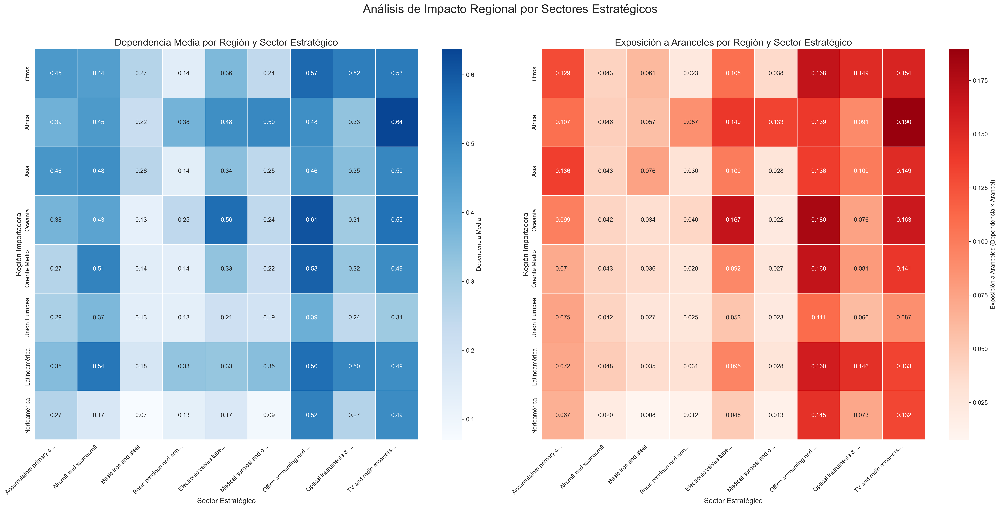

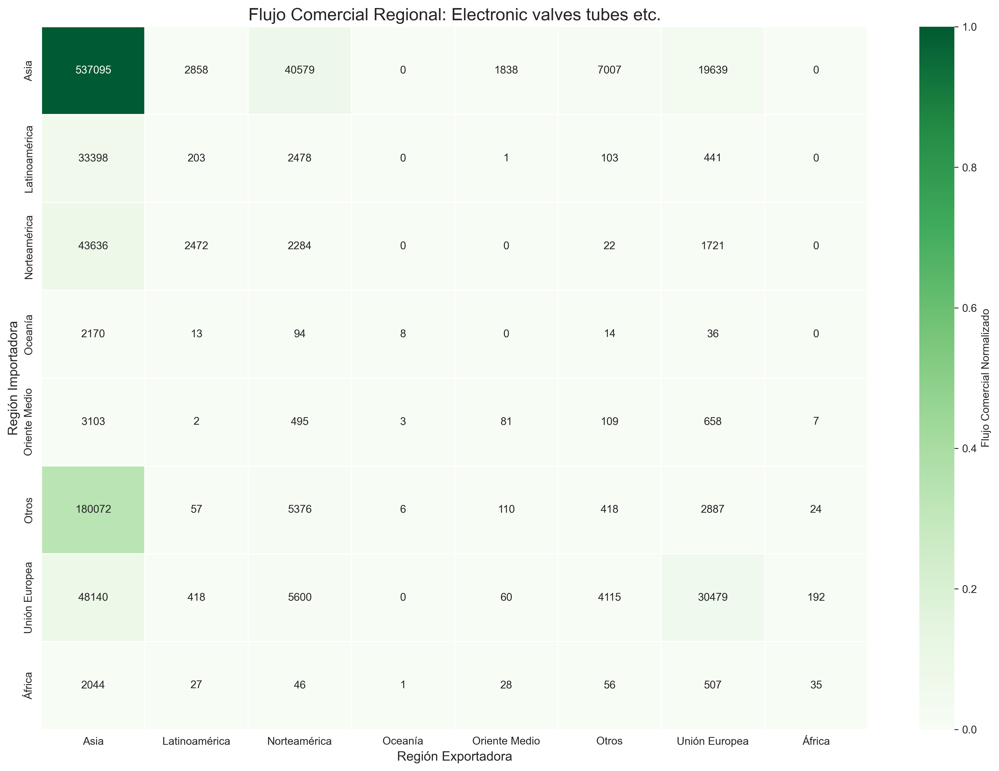

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from pathlib import Path

def analizar_impacto_regional_sectorial(df_full, sectores_estrategicos, output_path_fig, output_path_tab):
    """
    Crea un mapa de calor que muestra el impacto diferenciado por regiones geopolíticas
    y sectores estratégicos.
    
    Args:
        df_full: DataFrame con datos de dependencia
        sectores_estrategicos: Lista de sectores estratégicos a analizar
        output_path_fig: Ruta para guardar visualizaciones
        output_path_tab: Ruta para guardar tablas
    """
    print("Analizando impacto regional por sectores estratégicos...")
    
    # Filtrar por sectores estratégicos
    sector_data = df_full[df_full['industry'].isin(sectores_estrategicos)].copy()
    
    # Definir regiones geopolíticas
    def asignar_region(pais):
        eu_members = [
            "AUT", "BEL", "BGR", "HRV", "CYP", "CZE", "DNK", "EST", "FIN", "FRA",
            "DEU", "GRC", "HUN", "IRL", "ITA", "LVA", "LTU", "LUX", "MLT", "NLD",
            "POL", "PRT", "ROU", "SVK", "SVN", "ESP", "SWE"
        ]
        asia_countries = [
            "CHN", "JPN", "KOR", "TWN", "VNM", "THA", "MYS", "IDN", "PHL", "SGP",
            "BRN", "KHM", "LAO", "MMR", "LKA", "BGD", "PAK", "IND"
        ]
        latin_america = [
            "MEX", "BRA", "ARG", "COL", "CHL", "PER", "VEN", "ECU", "NIC", "URY",
            "BOL", "PRY", "GTM", "SLV", "HND", "PAN", "CRI", "DOM", "CUB"
        ]
        north_america = ["USA", "CAN"]
        middle_east = ["SAU", "ARE", "QAT", "IRN", "IRQ", "ISR", "JOR", "KWT", "OMN", "TUR"]
        africa = ["ZAF", "EGY", "NGA", "MAR", "TUN", "DZA", "GHA", "KEN", "ETH", "TZA", 
                 "UGA", "ZWE", "MOZ", "AGO", "NAM", "SEN", "CIV", "CMR", "COD", "TCD"]
        oceania = ["AUS", "NZL", "PNG", "FJI", "VUT", "SLB", "TON", "WSM"]
        
        if pais in eu_members:
            return "Unión Europea"
        elif pais in asia_countries:
            return "Asia"
        elif pais in latin_america:
            return "Latinoamérica"
        elif pais in north_america:
            return "Norteamérica"
        elif pais in middle_east:
            return "Oriente Medio"
        elif pais in africa:
            return "África"
        elif pais in oceania:
            return "Oceanía"
        else:
            return "Otros"
    
    # Asignar regiones a exportadores e importadores
    sector_data['region_exporter'] = sector_data['supplier_country'].apply(asignar_region)
    sector_data['region_importer'] = sector_data['dependent_country'].apply(asignar_region)
    
    # 1. Mapa de calor de dependencia total por región y sector
    # Agregar datos por región importadora y sector
    region_sector_dependency = sector_data.groupby(['region_importer', 'industry']).apply(
        lambda x: np.average(x['dependency_value'], weights=x['trade_value'] if x['trade_value'].sum() > 0 else None)
    ).reset_index(name='avg_dependency')
    
    # Crear pivot table para el mapa de calor
    pivot_dependency = region_sector_dependency.pivot_table(
        index='region_importer', 
        columns='industry', 
        values='avg_dependency',
        fill_value=0
    )
    
    # Ordenar regiones por dependencia promedio total
    region_order = sector_data.groupby('region_importer')['dependency_value'].mean().sort_values(ascending=False).index
    pivot_dependency = pivot_dependency.reindex(region_order)
    
    # Acortar nombres de sectores para mejor visualización
    shortened_sectors = {}
    for sector in pivot_dependency.columns:
        if len(sector) > 25:
            shortened_sectors[sector] = sector[:22] + "..."
        else:
            shortened_sectors[sector] = sector
    
    pivot_dependency = pivot_dependency.rename(columns=shortened_sectors)
    
    # 2. Mapa de calor de vulnerabilidad por aranceles por región y sector
    # Este mapa de calor combinará la dependencia con el efecto de aranceles
    # Asumimos que tenemos un diccionario de aranceles promedio por región
    # Si no lo tenemos, podemos crear uno aproximado para este análisis
    
    # Aranceles promedio aproximados por región de exportación (basados en datos anteriores)
    aranceles_region = {
        "Unión Europea": 20,
        "Asia": 30,  # Promedio entre China (34), Japón (24), etc.
        "Latinoamérica": 15,
        "Norteamérica": 5,
        "Oriente Medio": 20,
        "África": 25,
        "Oceanía": 10,
        "Otros": 20
    }
    
    # Agregar aranceles a los datos
    sector_data['tariff_exporter'] = sector_data['region_exporter'].map(aranceles_region)
    
    # Calcular exposición (dependencia * arancel)
    sector_data['exposure'] = sector_data['dependency_value'] * sector_data['tariff_exporter'] / 100
    
    # Agregar exposición por región importadora y sector
    region_sector_exposure = sector_data.groupby(['region_importer', 'industry']).apply(
        lambda x: np.average(x['exposure'], weights=x['trade_value'] if x['trade_value'].sum() > 0 else None)
    ).reset_index(name='avg_exposure')
    
    # Crear pivot table para el mapa de calor de exposición
    pivot_exposure = region_sector_exposure.pivot_table(
        index='region_importer', 
        columns='industry', 
        values='avg_exposure',
        fill_value=0
    )
    
    # Usar el mismo orden de regiones y nombres cortos de sectores
    pivot_exposure = pivot_exposure.reindex(region_order)
    pivot_exposure = pivot_exposure.rename(columns=shortened_sectors)
    
    # 3. Crear visualizaciones
    # Configurar figura con dos mapas de calor lado a lado
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))
    
    # Mapa de calor 1: Dependencia por región y sector
    # Paleta de azules para dependencia
    cmap_dependency = LinearSegmentedColormap.from_list(
        'blue_gradient', ['#f7fbff', '#deebf7', '#c6dbef', '#9ecae1', '#6baed6', '#4292c6', '#2171b5', '#084594'], N=256
    )
    
    sns.heatmap(
        pivot_dependency, 
        annot=True, 
        fmt=".2f", 
        cmap=cmap_dependency,
        linewidths=0.5,
        ax=ax1,
        cbar_kws={'label': 'Dependencia Media'}
    )
    
    ax1.set_title('Dependencia Media por Región y Sector Estratégico', fontsize=16)
    ax1.set_xlabel('Sector Estratégico', fontsize=12)
    ax1.set_ylabel('Región Importadora', fontsize=12)
    
    # Rotar etiquetas del eje x para mejor lectura
    plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')
    
    # Mapa de calor 2: Exposición a aranceles por región y sector
    # Paleta de rojos para exposición a aranceles
    cmap_exposure = LinearSegmentedColormap.from_list(
        'red_gradient', ['#fff5f0', '#fee0d2', '#fcbba1', '#fc9272', '#fb6a4a', '#ef3b2c', '#cb181d', '#99000d'], N=256
    )
    
    sns.heatmap(
        pivot_exposure, 
        annot=True, 
        fmt=".3f", 
        cmap=cmap_exposure,
        linewidths=0.5,
        ax=ax2,
        cbar_kws={'label': 'Exposición a Aranceles (Dependencia × Arancel)'}
    )
    
    ax2.set_title('Exposición a Aranceles por Región y Sector Estratégico', fontsize=16)
    ax2.set_xlabel('Sector Estratégico', fontsize=12)
    ax2.set_ylabel('Región Importadora', fontsize=12)
    
    # Rotar etiquetas del eje x para mejor lectura
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
    
    # Título general
    plt.suptitle('Análisis de Impacto Regional por Sectores Estratégicos', fontsize=20, y=0.98)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(output_path_fig / "mapa_calor_impacto_regional.png", dpi=300, bbox_inches='tight')
    print(f"Mapa de calor guardado en: {output_path_fig / 'mapa_calor_impacto_regional.png'}")
    
    # 4. Crear tablas para el análisis detallado
    # Tabla 1: Dependencia por región y sector (ordenada por dependencia total)
    region_summary = sector_data.groupby('region_importer').agg({
        'dependency_value': 'mean',
        'exposure': 'mean',
        'trade_value': 'sum'
    }).sort_values('dependency_value', ascending=False).reset_index()
    
    region_summary.columns = ['Región Importadora', 'Dependencia Media', 'Exposición Media', 'Valor Comercial Total']
    
    # Tabla 2: Top 3 sectores más vulnerables por región
    top_sectors_by_region = []
    for region in region_order:
        region_data = region_sector_exposure[region_sector_exposure['region_importer'] == region]
        if not region_data.empty:
            top3 = region_data.nlargest(3, 'avg_exposure')
            for _, row in top3.iterrows():
                top_sectors_by_region.append({
                    'Región': region,
                    'Sector': row['industry'],
                    'Exposición': row['avg_exposure']
                })
    
    top_sectors_table = pd.DataFrame(top_sectors_by_region)
    
    # Tabla 3: Matriz completa de exposición por región y sector
    exposure_matrix = pivot_exposure.copy()
    
    # Guardar tablas
    region_summary.to_csv(output_path_tab / "dependencia_por_region.csv", index=False)
    top_sectors_table.to_csv(output_path_tab / "top_sectores_vulnerables_por_region.csv", index=False)
    exposure_matrix.to_csv(output_path_tab / "matriz_exposicion_region_sector.csv")
    
    # Generar versiones LaTeX de las tablas
    try:
        region_summary.to_latex(output_path_tab / "dependencia_por_region.tex", index=False, float_format="%.3f")
        top_sectors_table.to_latex(output_path_tab / "top_sectores_vulnerables_por_region.tex", index=False, float_format="%.3f")
        exposure_matrix.to_latex(output_path_tab / "matriz_exposicion_region_sector.tex", float_format="%.3f")
        print(f"Tablas guardadas en: {output_path_tab}")
    except Exception as e:
        print(f"Error al generar tablas LaTeX: {e}")
    
    # 5. Análisis adicional: Mapa de calor de flujo comercial entre regiones por sector
    # Esto muestra qué regiones son más importantes como proveedoras para cada sector
    
    # Agregar flujo comercial por región exportadora, importadora y sector
    region_flow = sector_data.groupby(['region_exporter', 'region_importer', 'industry'])['trade_value'].sum().reset_index()
    
    # Seleccionar un sector de interés para visualizar (podemos iterar sobre todos si es necesario)
    # Elegimos el sector con mayor valor comercial total
    top_sector = sector_data.groupby('industry')['trade_value'].sum().idxmax()
    
    # Filtrar datos para ese sector
    top_sector_flow = region_flow[region_flow['industry'] == top_sector]
    
    # Crear pivot para mapa de calor
    pivot_flow = top_sector_flow.pivot_table(
        index='region_importer',
        columns='region_exporter',
        values='trade_value',
        fill_value=0
    )
    
    # Normalizar por máximo para mejor visualización
    pivot_flow_norm = pivot_flow / pivot_flow.max().max()
    
    # Crear figura
    plt.figure(figsize=(14, 10))
    
    # Mapa de calor para flujo comercial normalizado
    cmap_flow = LinearSegmentedColormap.from_list(
        'green_gradient', ['#f7fcf5', '#e5f5e0', '#c7e9c0', '#a1d99b', '#74c476', '#41ab5d', '#238b45', '#005a32'], N=256
    )
    
    sns.heatmap(
        pivot_flow_norm,
        annot=pivot_flow.values,  # Mostrar valores originales
        fmt=".0f",  # Sin decimales para valores comerciales
        cmap=cmap_flow,
        linewidths=0.5,
        cbar_kws={'label': 'Flujo Comercial Normalizado'}
    )
    
    plt.title(f'Flujo Comercial Regional: {top_sector}', fontsize=16)
    plt.xlabel('Región Exportadora', fontsize=12)
    plt.ylabel('Región Importadora', fontsize=12)
    
    plt.tight_layout()
    plt.savefig(output_path_fig / f"flujo_comercial_regional_{top_sector.replace(' ', '_')}.png", dpi=300, bbox_inches='tight')
    print(f"Mapa de flujo comercial guardado en: {output_path_fig / f'flujo_comercial_regional_{top_sector.replace(' ', '_')}.png'}")
    
    return {
        'dependency_heatmap': pivot_dependency,
        'exposure_heatmap': pivot_exposure,
        'region_summary': region_summary,
        'top_sectors_by_region': top_sectors_table,
        'flow_heatmap': pivot_flow
    }

# Ejecutar el análisis de impacto regional por sectores
resultados_impacto_regional = analizar_impacto_regional_sectorial(
    df_full, 
    sectores_estrategicos, 
    output_path_fig, 
    output_path_tabs
)

Ejercicio 5: Análisis de resiliencia y diversificación
Análisis propuesto
Evaluaríamos la capacidad de Estados Unidos para diversificar sus fuentes de suministro como respuesta a los aranceles autoimpuestos.

Gráfico guardado en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\figures\resilience_analysis.png
Tablas guardadas en: c:\Users\Usuario\Documents\Github\Seguridad económica\src\notebooks\visualization\Nota Elcano\tables

Sectores más críticos (menor resiliencia):
- Accumulators primary cells and batteries: Puntuación 55.65, Exposición 93.12%, 143 proveedores alternativos
- Electronic valves tubes etc.: Puntuación 56.25, Exposición 95.78%, 145 proveedores alternativos
- Office accounting and computing machinery: Puntuación 56.90, Exposición 88.10%, 144 proveedores alternativos

Sectores más resilientes:
- Basic precious and non-ferrous metals: Puntuación 75.69, Exposición 53.22%, 142 proveedores alternativos
- Basic iron and steel: Puntuación 68.62, Exposición 68.69%, 142 proveedores alternativos
- Medical surgical and orthopaedic equipment: Puntuación 65.15, Exposición 76.80%, 143 proveedores alternativos


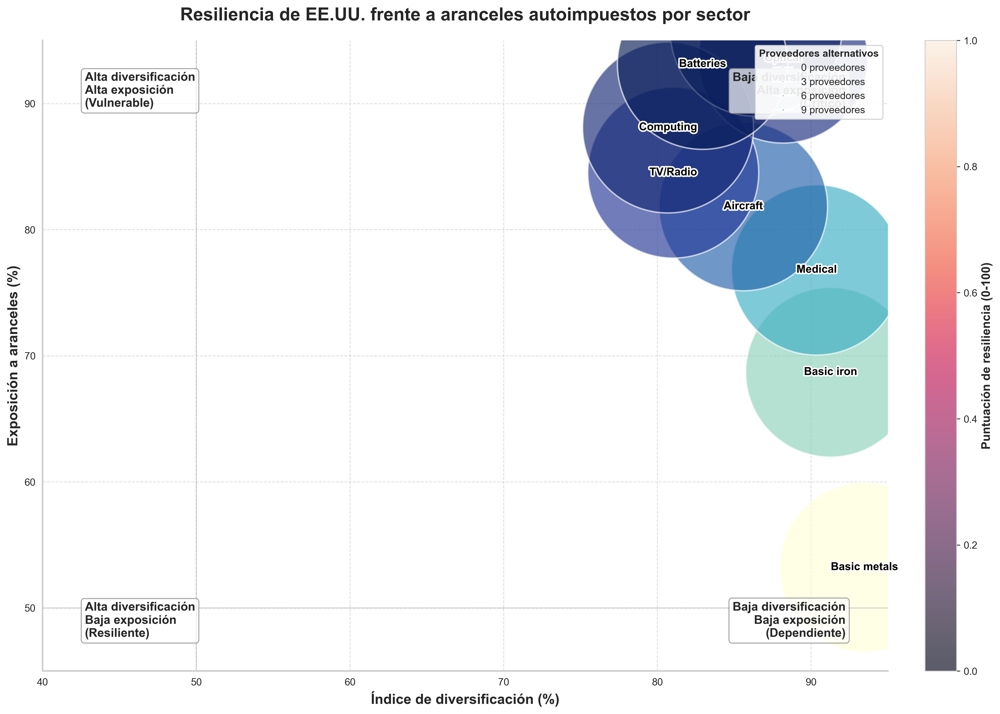

In [ ]:
def analizar_resiliencia(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tab):
    """
    Analiza la capacidad de diversificación y resiliencia de EE.UU. frente a aranceles autoimpuestos.
    """
    # Filtrar datos de EE.UU. como importador y sectores estratégicos
    us_data = df_full[
        (df_full['dependent_country'] == 'USA') &
        (df_full['industry'].isin(sectores_estrategicos))
    ].copy()

    # Añadir columna de aranceles
    us_data['tariff'] = us_data['supplier_country'].map(lambda x: aranceles.get(x, 0))

    # Calcular índice de diversificación por sector
    diversification = []

    for sector in sectores_estrategicos:
        sector_slice = us_data[us_data['industry'] == sector]

        if len(sector_slice) == 0:
            continue

        # Calcular dependencia total del sector sumando todas las dependencias
        total_dependency = sector_slice.groupby('supplier_country')['dependency_value'].mean().sum()

        # Calcular dependencia afectada por aranceles
        tariffed_slice = sector_slice[sector_slice['tariff'] > 0]
        tariffed_dependency = tariffed_slice.groupby('supplier_country')['dependency_value'].mean().sum()

        # Calcular índice HHI (Herfindahl-Hirschman Index)
        # Obtenemos la participación de cada país en la dependencia total
        country_deps = sector_slice.groupby('supplier_country')['dependency_value'].mean()

        if total_dependency > 0:
            shares = country_deps / total_dependency
            hhi = (shares ** 2).sum()
        else:
            hhi = 0

        # Índice de diversificación (HHI invertido y normalizado)
        diversification_index = (1 - hhi) * 100

        # Porcentaje de dependencia afectada por aranceles
        tariff_exposure = (tariffed_dependency / total_dependency) * 100 if total_dependency > 0 else 0

        # Número de proveedores alternativos con arancel cero
        alternative_suppliers = len(sector_slice[sector_slice['tariff'] == 0]['supplier_country'].unique())

        # Número total de proveedores
        total_suppliers = len(sector_slice['supplier_country'].unique())

        # Calcular el arancel promedio ponderado por dependencia
        if total_dependency > 0:
            weighted_tariff = (sector_slice['dependency_value'] * sector_slice['tariff']).sum() / total_dependency
        else:
            weighted_tariff = 0

        diversification.append({
            'sector': sector,
            'diversification_index': diversification_index,
            'tariff_exposure': tariff_exposure,
            'alternative_suppliers': alternative_suppliers,
            'total_suppliers': total_suppliers,
            'total_dependency': total_dependency,
            'weighted_tariff': weighted_tariff
        })

    # Convertir a DataFrame
    df_diversification = pd.DataFrame(diversification)

    # Calcular un índice de resiliencia compuesto
    # Alto índice de diversificación + Bajo porcentaje de exposición + Muchos proveedores alternativos = Alta resiliencia
    # Normalizamos cada componente a un rango de 0-100
    max_alt = df_diversification['alternative_suppliers'].max()

    df_diversification['resilience_score'] = (
        df_diversification['diversification_index'] * 0.4 +
        (100 - df_diversification['tariff_exposure']) * 0.4 +
        (df_diversification['alternative_suppliers'] / max_alt * 100 if max_alt > 0 else 0) * 0.2
    )

    # Ordenar por puntaje de resiliencia
    df_diversification = df_diversification.sort_values('resilience_score', ascending=False)

    # Crear visualización
    fig, ax = plt.subplots(figsize=(14, 10))

    # Configuración de estilo sugerida - SIN USAR SEABORN-WHITEGRID
    # En lugar de usar un estilo predefinido, configuramos elementos individuales
    ax.grid(True, linestyle='--', alpha=0.7)

    # Mejorar los límites del gráfico
    ax.set_xlim(40, 95)  # Ajustar rango del eje X para mejor distribución
    ax.set_ylim(45, 95)  # Ajustar rango del eje Y para mejor distribución

    # Colores según puntuación de resiliencia - usar un mapa más contrastado
    norm = plt.Normalize(df_diversification['resilience_score'].min(), df_diversification['resilience_score'].max())
    cmap = plt.cm.YlGnBu_r  # Cambiar a un mapa de colores más atractivo
    colors = cmap(norm(df_diversification['resilience_score']))

    # Tamaño según número de proveedores alternativos - ajustar para mejor visibilidad
    min_size = 300
    max_size = 2000
    sizes = df_diversification['alternative_suppliers'] * 200 + min_size

    # Crear scatter plot
    scatter = ax.scatter(
        df_diversification['diversification_index'],
        df_diversification['tariff_exposure'],
        s=sizes,
        c=colors,
        alpha=0.65,  # Reducir opacidad para mejor legibilidad
        edgecolors='white',
        linewidth=1.5
    )

    # Anotar sectores con mejor formato
    for _, row in df_diversification.iterrows():
        # Acortar nombres de sectores para mayor claridad
        sector_name = row['sector'].split(' ')[0]
        if sector_name in ["Basic", "Aircraft", "TV", "Office", "Medical", "Electronic", "Optical", "Accumulators"]:
            if "Basic" in row['sector']:
                if "iron" in row['sector']:
                    sector_name = "Basic iron"
                elif "precious" in row['sector']:
                    sector_name = "Basic metals"
            elif "Aircraft" in row['sector']:
                sector_name = "Aircraft"
            elif "Medical" in row['sector']:
                sector_name = "Medical"
            elif "Electronic" in row['sector']:
                sector_name = "Electronic"
            elif "Office" in row['sector']:
                sector_name = "Computing"
            elif "Optical" in row['sector']:
                sector_name = "Optical"
            elif "TV" in row['sector']:
                sector_name = "TV/Radio"
            elif "Accumulators" in row['sector']:
                sector_name = "Batteries"

        text = ax.annotate(
            sector_name,
            (row['diversification_index'], row['tariff_exposure']),
            xytext=(0, 0),
            textcoords='offset points',
            fontsize=11,
            fontweight='bold',
            color='black',
            ha='center', va='center',
            path_effects=[path_effects.withStroke(linewidth=3, foreground='white')]
        )

    # Etiquetas y título con mejor formato
    ax.set_xlabel('Índice de diversificación (%)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Exposición a aranceles (%)', fontsize=14, fontweight='bold')
    ax.set_title('Resiliencia de EE.UU. frente a aranceles autoimpuestos por sector',
                 fontsize=18, fontweight='bold', pad=20)

    # Líneas de referencia para cuadrantes más sutiles
    ax.axhline(y=50, color='gray', linestyle='-', alpha=0.3, linewidth=1)
    ax.axvline(x=50, color='gray', linestyle='-', alpha=0.3, linewidth=1)

    # Leyenda para puntuación de resiliencia
    cbar = plt.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Puntuación de resiliencia (0-100)', fontsize=12, fontweight='bold')

    # Leyenda para tamaño (proveedores alternativos) - mejorada
    legend_elements = []
    for n_suppliers in [0, 3, 6, 9]:
        size = n_suppliers * 200 + min_size
        legend_elements.append(
            plt.Line2D([0], [0], marker='o', color='w',
                       markerfacecolor=cmap(0.5), markersize=np.sqrt(size)/10,
                       label=f'{n_suppliers} proveedores')
        )

    legend = ax.legend(handles=legend_elements, loc='upper right',
                       title="Proveedores alternativos",
                       frameon=True, framealpha=0.9,
                       fontsize=10)

    if hasattr(legend, 'get_title'):
        legend.get_title().set_fontweight('bold')

    # Marcar cuadrantes con mejor visibilidad
    cuadrante_style = dict(fontsize=12, fontweight='bold', bbox=dict(
        boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.7))

    ax.text(0.05, 0.95, "Alta diversificación\nAlta exposición\n(Vulnerable)",
            transform=ax.transAxes, va='top', ha='left', **cuadrante_style)
    ax.text(0.95, 0.95, "Baja diversificación\nAlta exposición\n(Crítico)",
            transform=ax.transAxes, va='top', ha='right', **cuadrante_style)
    ax.text(0.05, 0.05, "Alta diversificación\nBaja exposición\n(Resiliente)",
            transform=ax.transAxes, va='bottom', ha='left', **cuadrante_style)
    ax.text(0.95, 0.05, "Baja diversificación\nBaja exposición\n(Dependiente)",
            transform=ax.transAxes, va='bottom', ha='right', **cuadrante_style)

    # Mejorar la apariencia general
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['left'].set_linewidth(1.5)

    plt.tight_layout()

    # Guardar figura con alta calidad
    plt.savefig(output_path_fig / "resilience_analysis.png", dpi=300, bbox_inches='tight')

    print(f"Gráfico guardado en: {output_path_fig / 'resilience_analysis.png'}")

    # También crear una tabla con los resultados
    table_data = df_diversification[['sector', 'diversification_index', 'tariff_exposure',
                                     'alternative_suppliers', 'total_suppliers', 'weighted_tariff',
                                     'resilience_score']]

    table_data.columns = ['Sector', 'Índice diversificación', 'Exposición arancelaria (%)',
                            'Proveedores alternativos', 'Proveedores totales',
                            'Arancel promedio ponderado', 'Puntuación resiliencia']

    # Guardar como CSV
    table_data.to_csv(output_path_tab / "resilience_analysis.csv", index=False)

    # Añadir categorización de resiliencia
    table_data['Categoría'] = pd.cut(
        table_data['Puntuación resiliencia'],
        bins=[0, 30, 60, 100],
        labels=['Crítico', 'Moderado', 'Resiliente']
    )

    # Guardar versión con categorías
    table_data.to_csv(output_path_tab / "resilience_categorized.csv", index=False)

    # Crear tabla LaTeX
    try:
        latex_table = table_data.sort_values('Puntuación resiliencia', ascending=False).to_latex(
            index=False, float_format="%.2f"
        )
        with open(output_path_tab / "resilience_analysis.tex", "w") as f:
            f.write(latex_table)
    except Exception as e:
        print(f"Error al crear tabla LaTeX: {e}")

    print(f"Tablas guardadas en: {output_path_tab}")

    # Análisis adicional: tabla de sectores más críticos y más resilientes
    critical_sectors = df_diversification.sort_values('resilience_score').head(3)
    resilient_sectors = df_diversification.sort_values('resilience_score', ascending=False).head(3)

    print("\nSectores más críticos (menor resiliencia):")
    for _, row in critical_sectors.iterrows():
        print(f"- {row['sector']}: Puntuación {row['resilience_score']:.2f}, "
              f"Exposición {row['tariff_exposure']:.2f}%, {row['alternative_suppliers']} proveedores alternativos")

    print("\nSectores más resilientes:")
    for _, row in resilient_sectors.iterrows():
        print(f"- {row['sector']}: Puntuación {row['resilience_score']:.2f}, "
              f"Exposición {row['tariff_exposure']:.2f}%, {row['alternative_suppliers']} proveedores alternativos")

    return {
        'diversification_data': df_diversification,
        'critical_sectors': critical_sectors,
        'resilient_sectors': resilient_sectors
    }

# Asegúrate de que sectores_estrategicos esté definido
if 'sectores_estrategicos' not in globals():
    sectores_estrategicos = [
        'Aircraft and spacecraft',
        'Accumulators primary cells and batteries',
        'Basic iron and steel',
        'Basic precious and non-ferrous metals',
        'Electronic valves tubes etc.',
        'TV and radio receivers and associated goods',
        'Office accounting and computing machinery',
        'Medical surgical and orthopaedic equipment',
        'Optical instruments & photographic equipment'
    ]

# Ejecutar el análisis
# Assuming df_full, aranceles, output_path_fig, and output_path_tabs are defined elsewhere
# resultados_resiliencia = analizar_resiliencia(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tabs)

# Ejecutar el análisis
resultados_resiliencia = analizar_resiliencia(df_full, aranceles, sectores_estrategicos, output_path_fig, output_path_tabs)